In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn import datasets
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import cluster, mixture # For clustering 
import types
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import seaborn as sns
init_notebook_mode(connected=True)
from IPython.display import display
%matplotlib inline

In [2]:
# # importing the required module 
# import timeit 
  
# # code snippet to be executed only once 
# mysetup = "from math import sqrt"
  
# # code snippet whose execution time is to be measured 
# mycode = '''
# mylist=[]
# for x in range(100):
#     mylist.append(sqrt(x)) 
# '''
  
# # timeit statement 
# print(timeit.timeit(setup = mysetup, 
#                     stmt = mycode, 
#                     number = 1000000))

In [15]:
#data load
df = pd.read_csv("us_2018.csv")
df = df.sample(frac=0.10, random_state=1) #taking 10% sample for now

id_col = ['customer_id']
num_cols = [x for x in df.columns if x not in id_col]
df.drop(['customer_id'],inplace=True, axis=1)

df_bu = df.copy()

df.head(2)

,tenure,free_units,paid_units,num_streaming_session_2018,count_streaming_month
27146,76,11,1,18,2
23028,96,13,4,85,8


In [16]:
# #for all clustering
# df2 = df.copy()
# cols_to_norm = ['free_units','paid_units','num_streaming_session_2018']
# df2[cols_to_norm] = MinMaxScaler().fit_transform(df2[cols_to_norm])

# x1 = np.array(df2.sample(frac=0.10, random_state=1)["paid_units"])
# x2 = np.array(df2.sample(frac=0.10, random_state=1)["num_streaming_session_2018"])

# X = np.array(list(zip(x1, x2))).reshape(len(x1), 2)

C:\Users\YC\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:334: DataConversionWarning:

Data with input dtype int64 were all converted to float64 by MinMaxScaler.



# Exploratory Data Analysis #

In [167]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16126 entries, 27146 to 12896
Data columns (total 5 columns):
tenure                        16126 non-null int64
free_units                    16126 non-null int64
paid_units                    16126 non-null int64
num_streaming_session_2018    16126 non-null int64
count_streaming_month         16126 non-null int64
dtypes: int64(5)
memory usage: 755.9 KB


In [5]:
#plot histograms

#function  for histogram for customer attrition types
def histogram(column) :
    trace1 = go.Histogram(x  = df[column],
                          histnorm= "percent",
                          name = "US Customers 2018",
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
  
    
    data = [trace1]
    layout = go.Layout(dict(title = column + " distribution of US Customers",
                            plot_bgcolor  = "rgb(255,255,255)",
                            paper_bgcolor = "rgb(255,255,255)",
                            xaxis = dict(gridcolor = 'rgb(80, 80, 80)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(80, 80, 80)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                      )
    fig  = go.Figure(data=data,layout=layout)
    
    iplot(fig)
    

#for all numeric columns plot histogram    
for i in num_cols :
    histogram(i)    

## Normalize data ##

In [21]:
#for all numeric columns plot histogram    
cols_to_norm = ['free_units','paid_units','num_streaming_session_2018']

df[cols_to_norm] = MinMaxScaler().fit_transform(df[cols_to_norm])
#df[cols_to_norm] = StandardScaler().fit_transform(df[cols_to_norm])

C:\Users\YC\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:334: DataConversionWarning:

Data with input dtype int64 were all converted to float64 by MinMaxScaler.



In [8]:
#plot histograms again

#function  for histogram for customer attrition types
def histogram(column) :
    trace1 = go.Histogram(x  = df[column],
                          histnorm= "percent",
                          name = "US Customers 2018",
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
  
    
    data = [trace1]
    layout = go.Layout(dict(title = column + " distribution of US Customers",
                            plot_bgcolor  = "rgb(255,255,255)",
                            paper_bgcolor = "rgb(255,255,255)",
                            xaxis = dict(gridcolor = 'rgb(80, 80, 80)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(80, 80, 80)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                      )
    fig  = go.Figure(data=data,layout=layout)
    
    iplot(fig)
    

#for all numeric columns plot histogram    
for i in cols_to_norm :
    histogram(i)    

In [9]:
#list(set(num_cols) - set(cols_to_norm))

In [10]:
#scatter plots

# creating trace1
trace1 =go.Scatter(
                    x = df.tenure,
                    y = df.free_units,
                    mode = "markers",
                    name = "tenure and free units",
                    marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                    )

data = [trace1]
layout = dict(title = 'tenure vs free units (normalized)',
              xaxis= dict(title= 'Tenure',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'free units',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [11]:
#scatter plots

# creating trace1
trace1 =go.Scatter(
                    x = df.tenure,
                    y = df.paid_units,
                    mode = "markers",
                    name = "tenure and paid units",
                    marker = dict(color = 'rgba(133, 239, 172, 0.9)'),
                    )

data = [trace1]
layout = dict(title = 'tenure vs paid units (normalized)',
              xaxis= dict(title= 'Tenure',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'paid units',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [12]:
#scatter plots

# creating trace1
trace1 =go.Scatter(
                    x = df.tenure,
                    y = df.num_streaming_session_2018,
                    mode = "markers",
                    name = "tenure and # of reading sessions units",
                    marker = dict(color = 'rgba(133, 239, 172, 0.9)'),
                    )

data = [trace1]
layout = dict(title = 'tenure vs # of streaming sessions (normalized)',
              xaxis= dict(title= 'Tenure',ticklen= 5,zeroline= False),
              yaxis= dict(title= '# of streaming sessions',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [13]:
csm = list(df["count_streaming_month"].unique())
csm.sort()

In [14]:

#1. iterate through each level of discrete variable and create trace, and plot them on the same window

#function  for boxplots
def boxplot(target, disc_var_name, disc_var): #column is target, disc_var (crm) is the levels (x-axis)
    
    levels = len(disc_var)
    
    for i in range(len(disc_var)):
        globals()['trace%s' % disc_var[i]] = go.Box(y = df[df[disc_var_name] == disc_var[i]][target],
                                                    name = str(disc_var[i]),
                                                    marker = dict(color = 'rgb(12, 128, 128)'))
        data = []
        
        data.append(globals()['trace%s' % disc_var[i]])
                
        layout = go.Layout(title=str(target) + " " + str(disc_var_name),                            
                           
                           xaxis=go.layout.XAxis(
                                title = str(disc_var_name)),

                           yaxis=go.layout.YAxis(
                                title = str(target)
                            )
                        )

        fig = go.Figure(data=data, layout=layout)

        iplot(fig)
        
        
                                                                    

In [15]:
boxplot("num_streaming_session_2018","count_streaming_month",csm)

In [16]:
boxplot("free_units","count_streaming_month",csm)

In [17]:
boxplot("paid_units","count_streaming_month",csm)

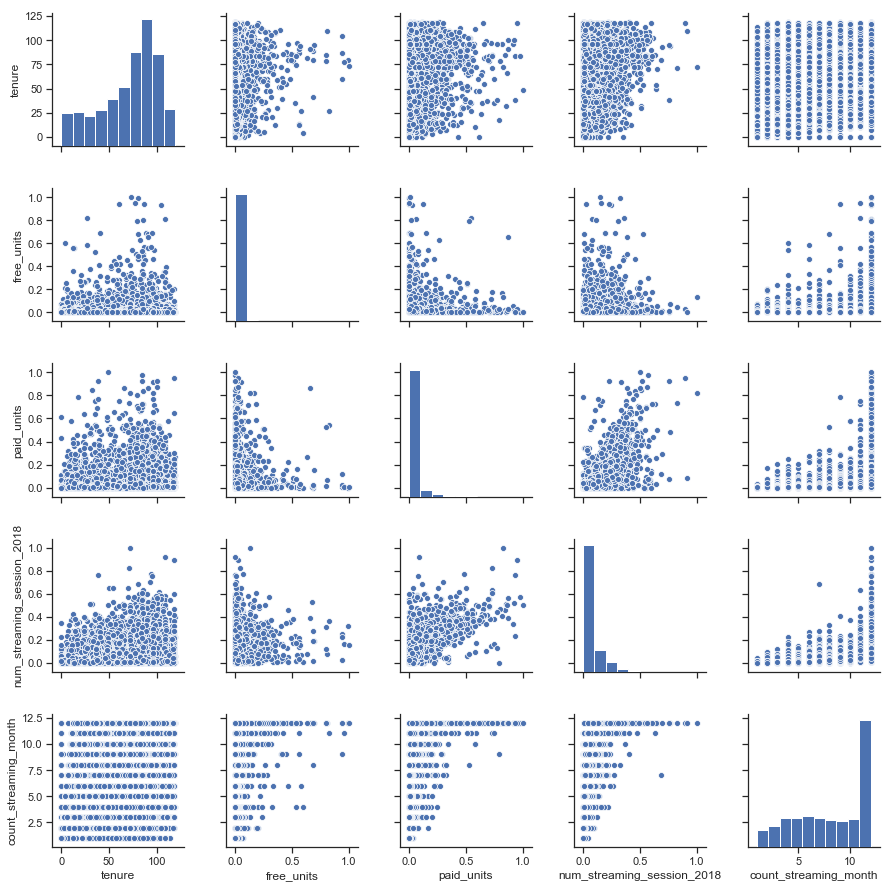

In [18]:
#Scatter plot matrix using seaborn
sns.set(style="ticks")

sns.pairplot(df)

# Clustering #

### Kmeans ###

In [19]:
#scatter plots

# creating trace1
trace1 =go.Scatter(
                    x = df.paid_units,
                    y = df.num_streaming_session_2018,
                    mode = "markers",
                    name = "paid units and number of streaming sessions",
                    marker = dict(color = 'rgba(133, 239, 172, 0.9)'),
                    )

data = [trace1]
layout = dict(title = 'tenure vs paid units (normalized)',
              xaxis= dict(title= 'paid units',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'number of streaming sessions',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

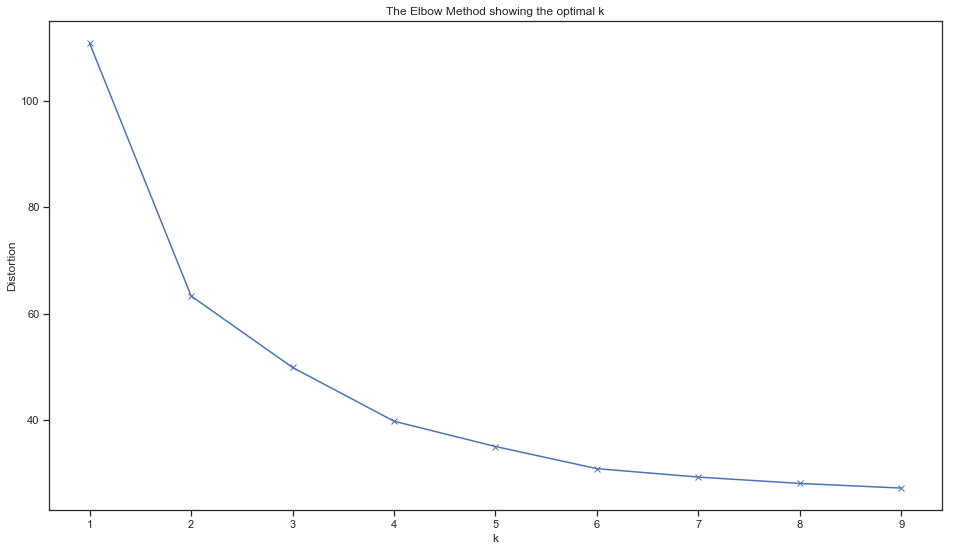

In [215]:
# clustering dataset
# determine k using elbow method
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

x1 = np.array(df["paid_units"])
x2 = np.array(df["num_streaming_session_2018"])

X = np.array(list(zip(x1, x2))).reshape(len(x1), 2)

# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(X)
    kmeanModel.fit(X)
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

# Plot the elbow
plt.rcParams["figure.figsize"] = [16,9]
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [169]:
#k = 5
kmeans = KMeans(n_clusters=5, random_state=101)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

### Kmeans resulting clusters ###

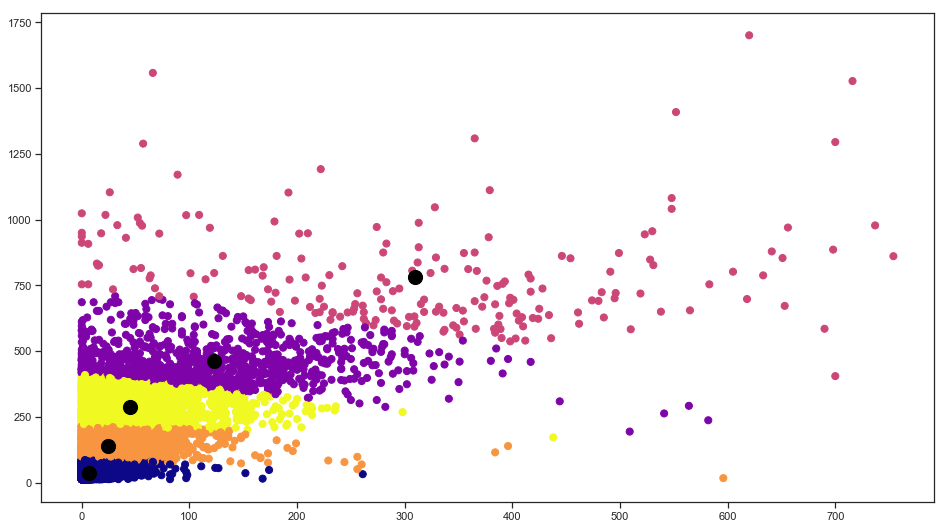

In [170]:
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='plasma')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=1.0);

In [171]:
#Clustering Result
iid = pd.DataFrame(y_kmeans)[0].value_counts(normalize=True).index
vid = pd.Series(pd.DataFrame(y_kmeans)[0].value_counts(normalize=True).values*100)

for i, j in zip(iid, vid):
    print("Cluster " + str(i) + " comprised of " + str(round(j,1)) + "%")

Cluster 0 comprised of 61.5%
Cluster 3 comprised of 20.1%
Cluster 4 comprised of 11.8%
Cluster 1 comprised of 5.4%
Cluster 2 comprised of 1.2%


In [172]:
#merge back the clustering result to the non-normalized vectors
df_cl = df_bu.copy()
df_cl["kmeans_cluster_label"] = y_kmeans

In [174]:
pd.options.display.max_columns = None
display(round(df_cl.groupby(by=["kmeans_cluster_label"]).mean(),3))

,tenure,free_units,paid_units,num_streaming_session_2018,count_streaming_month
kmeans_cluster_label,,,,,
0,66.212,4.819,7.000,36.481,6.282
1,78.225,32.110,122.494,462.158,11.889
2,77.328,46.567,309.781,782.637,11.910
3,73.780,11.847,24.465,140.748,10.452
4,78.163,19.724,44.829,289.284,11.666


In [175]:
pd.options.display.max_columns = None
display(round(df_cl.groupby(by=["kmeans_cluster_label"]).describe(),3))

tenure                                                \
                       count    mean     std  min   25%   50%   75%    max   
kmeans_cluster_label                                                         
0                     9911.0  66.212  31.398  0.0  43.0  74.0  91.0  119.0   
1                      871.0  78.225  24.438  0.0  66.0  84.0  96.0  119.0   
2                      201.0  77.328  25.394  0.0  65.0  84.0  96.0  119.0   
3                     3243.0  73.780  27.792  0.0  58.0  82.0  95.0  119.0   
4                     1900.0  78.163  24.955  0.0  65.0  84.0  96.0  118.0   

                     free_units                                                \
                          count    mean      std  min  25%   50%   75%    max   
kmeans_cluster_label                                                            
0                        9911.0   4.819   21.640  0.0  0.0   0.0   4.0  914.0   
1                         871.0  32.110   83.699  0.0  1.0   5.0  22.0  962.0   
2                         201.0  46.567  112.228  0.0  2.0  11.0  42.0  797.0   
3                        3243.0  11.847   40.294  0.0  0.0   1.0   9.0  783.0   
4                        1900.0  19.724   65.446  0.0  0.0   2.0  12.0  970.0   

                     paid_units                                               \
                          count     mean      std  min     25%    50%    75%   
kmeans_cluster_label                                                           
0                        9911.0    7.000    9.854  0.0    1.00    4.0    9.0   
1                         871.0  122.494   88.424  0.0   57.00  109.0  174.0   
2                         201.0  309.781  177.133  0.0  192.00  312.0  409.0   
3                        3243.0   24.465   29.539  0.0    7.00   17.0   32.0   
4                        1900.0   44.829   42.926  0.0   13.75   32.0   65.0   

                            num_streaming_session_2018                    \
                        max                      count     mean      std   
kmeans_cluster_label                                                       
0                     261.0                     9911.0   36.481   20.711   
1                     582.0                      871.0  462.158   76.743   
2                     754.0                      201.0  782.637  191.260   
3                     596.0                     3243.0  140.748   36.426   
4                     438.0                     1900.0  289.284   49.545   

                                                          \
                        min    25%    50%    75%     max   
kmeans_cluster_label                                       
0                      13.0   19.0   30.0   50.0    91.0   
1                     194.0  407.0  448.0  506.0   709.0   
2                     405.0  649.0  738.0  862.0  1701.0   
3                      17.0  109.0  136.0  170.0   218.0   
4                     172.0  246.0  285.0  330.0   412.0   

                     count_streaming_month                                  \
                                     count    mean    std  min   25%   50%   
kmeans_cluster_label                                                         
0                                   9911.0   6.282  2.738  1.0   4.0   6.0   
1                                    871.0  11.889  0.636  4.0  12.0  12.0   
2                                    201.0  11.910  0.471  7.0  12.0  12.0   
3                                   3243.0  10.452  1.888  2.0  10.0  11.0   
4                                   1900.0  11.666  0.967  3.0  12.0  12.0   

                                  
                       75%   max  
kmeans_cluster_label              
0                      8.0  12.0  
1                     12.0  12.0  
2                     12.0  12.0  
3                     12.0  12.0  
4                     12.0  12.0

### <font color=red> __Observations__ </font> ###
- __Majority of the streamers (cluster 0: 61.5%) is comprised of those with tenure of 66 months, who played 4.8 free shows, 7 paid shows, and 36 streaming sessions and 6 distinct months of when they streamed, thus pretty choppy__
- __The most avid streamers (cluster 2: 1.2%) are comprised of those of tenure of 77 months, and on average played 309 paid shows last year__

### Other Clustering Algos ###

C:\Users\YC\Anaconda3\lib\site-packages\sklearn\cluster\hierarchical.py:244: UserWarning:

the number of connected components of the connectivity matrix is 223 > 1. Completing it to avoid stopping the tree early.

C:\Users\YC\Anaconda3\lib\site-packages\sklearn\cluster\hierarchical.py:480: UserWarning:

the number of connected components of the connectivity matrix is 223 > 1. Completing it to avoid stopping the tree early.

C:\Users\YC\Anaconda3\lib\site-packages\sklearn\cluster\birch.py:629: ConvergenceWarning:

Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.



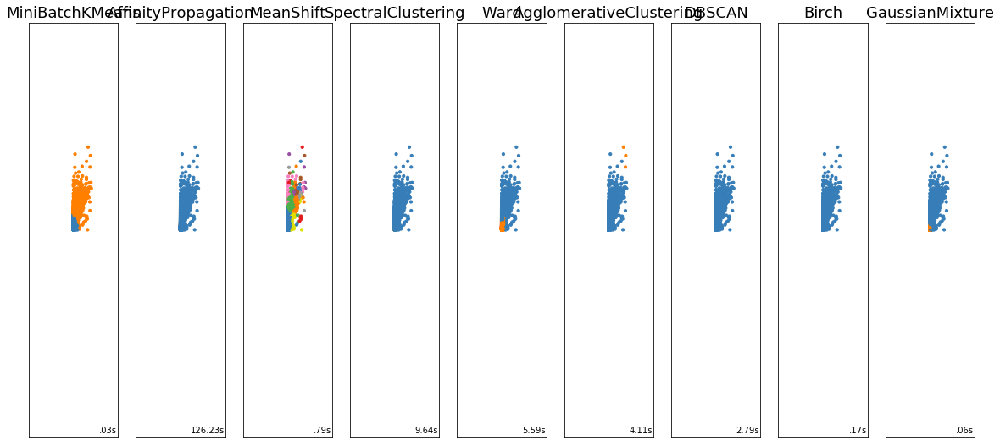

In [23]:
import time
import warnings

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

np.random.seed(0)

plot_num = 1

# Set up cluster parameters
default_base = {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 2,
                'min_samples': 10,
                'xi': 0.05,
                'min_cluster_size': 0.01}

datasets = [(X, default_base)]
   

for i_dataset, (dataset, algo_params) in enumerate(datasets):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)

    X_ = dataset

    # normalize dataset for easier parameter selection
    

    # estimate bandwidth for mean shift
    bandwidth = cluster.estimate_bandwidth(X, quantile=params['quantile'])

    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(
        X_, n_neighbors=params['n_neighbors'], include_self=False)
    # make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity.T)

    # ============
    # Create cluster objects
    # ============
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
    two_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'])
    ward = cluster.AgglomerativeClustering(
        n_clusters=params['n_clusters'], linkage='ward',
        connectivity=connectivity)
    spectral = cluster.SpectralClustering(
        n_clusters=params['n_clusters'], eigen_solver='arpack',
        affinity="nearest_neighbors")
    dbscan = cluster.DBSCAN(eps=params['eps'])
#     optics = cluster.OPTICS(min_samples=params['min_samples'],
#                             xi=params['xi'],
#                             min_cluster_size=params['min_cluster_size'])
    affinity_propagation = cluster.AffinityPropagation(
        damping=params['damping'], preference=params['preference'])
    average_linkage = cluster.AgglomerativeClustering(
        linkage="average", affinity="cityblock",
        n_clusters=params['n_clusters'], connectivity=connectivity)
    birch = cluster.Birch(n_clusters=params['n_clusters'])
    gmm = mixture.GaussianMixture(
        n_components=params['n_clusters'], covariance_type='full')

    clustering_algorithms = (
        ('MiniBatchKMeans', two_means),
        ('AffinityPropagation', affinity_propagation),
        ('MeanShift', ms),
        ('SpectralClustering', spectral),
        ('Ward', ward),
        ('AgglomerativeClustering', average_linkage),
        ('DBSCAN', dbscan),
       # ('OPTICS', optics),
        ('Birch', birch),
        ('GaussianMixture', gmm)
    )

    for name, algorithm in clustering_algorithms:
        t0 = time.time()

        # catch warnings related to kneighbors_graph
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the " +
                "connectivity matrix is [0-9]{1,2}" +
                " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning)
            warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding" +
                " may not work as expected.",
                category=UserWarning)
            algorithm.fit(X_)

        t1 = time.time()
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(np.int)
        else:
            y_pred = algorithm.predict(X_)

        plt.subplot(len(datasets), len(clustering_algorithms), plot_num)
        if i_dataset == 0:
            plt.title(name, size=18)

        colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                             '#f781bf', '#a65628', '#984ea3',
                                             '#999999', '#e41a1c', '#dede00']),
                                      int(max(y_pred) + 1))))
        # add black color for outliers (if any)
        colors = np.append(colors, ["#000000"])
        plt.scatter(X_[:, 0], X_[:, 1], s=10, color=colors[y_pred])

        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks(())
        plt.yticks(())
        plt.text(.99, .01, ('%.2fs' % (t1 - t0)).lstrip('0'),
                 transform=plt.gca().transAxes, size=10,
                 horizontalalignment='right')

        plot_num += 1

plt.show()